# An App for Identifying the Breed of Dog from an Image

## Convolutional Neural Networks

---
An algorithm that could be used as part of a mobile or web app.  Code will accept any user-supplied image as input.  If a dog is detected in the image, it provides an estimate of the dog's breed.  If a human is detected, provides an estimate of the dog breed that it most resembles.  The image below displays potential sample output. 

![Sample Dog Output](images/sample_dog_output.png)


### Contents

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Use a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 6](#step6): Algorithm Code
* [Step 7](#step7): Algorithm Test

---
<a id='step0'></a>
## Step 0: Import Datasets

### Import Dog Dataset

Import a dataset of dog images.  We populate a few variables through the use of the `load_files` function from the scikit-learn library:
- `train_files`, `valid_files`, `test_files` - numpy arrays containing file paths to images
- `train_targets`, `valid_targets`, `test_targets` - numpy arrays containing onehot-encoded classification labels 
- `dog_names` - list of string-valued dog breed names for translating labels

In [6]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob

# PLEASE UN-COMMENT THE CORRECT FILEPATH LINE BELOW (AND COMMENT OUT THE INCORRECT LINE)
filesRoot = 'C:\\Users\\pauls\Downloads\\'
#filesRoot = ''

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    dog_files = np.array(data['filenames'])
    dog_targets = np_utils.to_categorical(np.array(data['target']), 133)
    return dog_files, dog_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset(filesRoot + 'dogImages/train')
valid_files, valid_targets = load_dataset(filesRoot + 'dogImages/valid')
test_files, test_targets = load_dataset(filesRoot + 'dogImages/test')

# load list of dog names
dog_names = [item[item.rfind('/'):] for item in sorted(glob(filesRoot + 'dogImages/train/*/'))]
    
# print statistics about the dataset
print('There are %d total dog categories.' % len(dog_names))
print('There are %s total dog images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training dog images.' % len(train_files))
print('There are %d validation dog images.' % len(valid_files))
print('There are %d test dog images.'% len(test_files))

There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training dog images.
There are 835 validation dog images.
There are 836 test dog images.


### Import Human Dataset

In the code cell below, we import a dataset of human images, where the file paths are stored in the numpy array `human_files`.

In [15]:
import random
random.seed(8675309)

# load filenames in shuffled human dataset
human_files = np.array(glob(filesRoot + "lfw/lfw/*/*"))
random.shuffle(human_files)

# print statistics about the dataset
print('There are %d total human images.' % len(human_files))

There are 13233 total human images.


---
<a id='step1'></a>
## Step 1: Detect Humans

We use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.

In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

C:\Users\pauls\Downloads\lfw/lfw\Laurence_Fishburne\Laurence_Fishburne_0001.jpg
Number of faces detected: 1


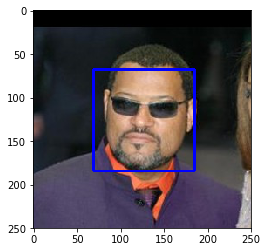

In [18]:
import cv2    
import os
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

print(human_files[3])
# load color (BGR) image
if os.path.isfile(human_files[3]):
    img = cv2.imread(human_files[3])
else:
    print("The following is not a valid file: ", human_files[3])
    
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [19]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  The above algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 

In [20]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]
# Do NOT modify the code above this line.

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
sumH = 0
sumD = 0
for i in range(len(human_files_short)):
    if face_detector(human_files_short[i]):
        sumH += 1
    if face_detector(dog_files_short[i]):
        sumD += 1

print('Human Face percentage accuracy:        ', 100*sumH/len(human_files_short))
print('Percent dogs classified as human face: ', 100*sumD/len(human_files_short))

Human Face percentage accuracy:         99.0
Percent dogs classified as human face:  11.0


Currently, the algorithm accepts human images only when they provide a clear view of a face. This does seem reasonable, given the objective is to create a "fun app" that tells the user what kind of dog they "are." However, in many face recognition problems, humans might not be as accomodating in supplying clean, frontal-face images. This, of course, is where rotational, scale, translational, and perspective (side/angle-view) invariant detectors should be called upon. This latter form of face detection becomes much more demanding to create and train.

In [21]:
## TODO: Report the performance of another  
## face detection algorithm on the LFW dataset

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a pre-trained [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006) model to detect dogs in images.  The first line of code downloads the ResNet-50 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/).  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  Given an image, the pre-trained ResNet-50 model returns a prediction (derived from the available categories in ImageNet) for the object that is contained in the image.

In [22]:
from keras.applications.resnet50 import ResNet50

# define ResNet50 model
ResNet50_model = ResNet50(weights='imagenet')

### Pre-process the Data

When using TensorFlow as backend, Keras CNNs require a 4D array (which we'll also refer to as a 4D tensor) as input, with shape

$$
(\text{nb_samples}, \text{rows}, \text{columns}, \text{channels}),
$$

where `nb_samples` corresponds to the total number of images (or samples), and `rows`, `columns`, and `channels` correspond to the number of rows, columns, and channels for each image, respectively.  

The `path_to_tensor` function below takes a string-valued file path to a color image as input and returns a 4D tensor suitable for supplying to a Keras CNN.  The function first loads the image and resizes it to a square image that is $224 \times 224$ pixels.  Next, the image is converted to an array, which is then resized to a 4D tensor.  In this case, since we are working with color images, each image has three channels.  Likewise, since we are processing a single image (or sample), the returned tensor will always have shape

$$
(1, 224, 224, 3).
$$

The `paths_to_tensor` function takes a numpy array of string-valued image paths as input and returns a 4D tensor with shape 

$$
(\text{nb_samples}, 224, 224, 3).
$$

Here, `nb_samples` is the number of samples, or number of images, in the supplied array of image paths.  We can think of `nb_samples` as the number of 3D tensors (where each 3D tensor corresponds to a different image) in the dataset!

In [23]:
from keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

### Making Predictions with ResNet-50

Getting the 4D tensor ready for ResNet-50, and for any other pre-trained model in Keras, requires some additional processing.  First, the RGB image is converted to BGR by reordering the channels.  All pre-trained models have the additional normalization step that the mean pixel (expressed in RGB as $[103.939, 116.779, 123.68]$ and calculated from all pixels in all images in ImageNet) must be subtracted from every pixel in each image.  This is implemented in the imported function `preprocess_input`.  Check the code for `preprocess_input` [here](https://github.com/fchollet/keras/blob/master/keras/applications/imagenet_utils.py).

Now that we have a way to format our image for supplying to ResNet-50, we are now ready to use the model to extract the predictions.  This is accomplished with the `predict` method, which returns an array whose $i$-th entry is the model's predicted probability that the image belongs to the $i$-th ImageNet category.  This is implemented in the `ResNet50_predict_labels` function below.

By taking the argmax of the predicted probability vector, we obtain an integer corresponding to the model's predicted object class, which we can identify with an object category through the use of this [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). 

In [24]:
from keras.applications.resnet50 import preprocess_input, decode_predictions

def ResNet50_predict_labels(img_path):
    # returns prediction vector for image located at img_path
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(ResNet50_model.predict(img))

### Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained ResNet-50 model, we need only check if the `ResNet50_predict_labels` function above returns a value between 151 and 268 (inclusive).

We use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [25]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    prediction = ResNet50_predict_labels(img_path)
    return ((prediction <= 268) & (prediction >= 151)) 

### (IMPLEMENTATION) Assess the Dog Detector

__Question 3:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 

In [26]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
sumH = 0
sumD = 0
for i in range(len(human_files_short)):
    if dog_detector(human_files_short[i]):
        sumH += 1
    if dog_detector(dog_files_short[i]):
        sumD += 1

print('Percentage humans classified as dog: ', 100*sumH/len(human_files_short), '%')
print('Percent dogs detected:               ', 100*sumD/len(human_files_short), '%')

Percentage humans classified as dog:  1.0 %
Percent dogs detected:                100.0 %


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 1%.  In Step 5 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

Be careful with adding too many trainable layers!  More parameters means longer training, which means you are more likely to need a GPU to accelerate the training process.  Thankfully, Keras provides a handy estimate of the time that each epoch is likely to take; you can extrapolate this estimate to figure out how long it will take for your algorithm to train. 

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have great difficulty in distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun! 

### Pre-process the Data

We rescale the images by dividing every pixel in every image by 255.

In [27]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

100%|████████████████████████████████████████████████████████████████████████████████| 836/836 [00:14<00:00, 58.54it/s]


### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        model.summary()

We have imported some Python modules to get you started, but feel free to import as many modules as you need.  If you end up getting stuck, here's a hint that specifies a model that trains relatively fast on CPU and attains >1% test accuracy in 5 epochs:

![Sample CNN](images/sample_cnn.png)
           
__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  If you chose to use the hinted architecture above, describe why you think that CNN architecture should work well for the image classification task.

__Answer:__  I stopped pursuing a better model when my CNN architecture attained a 4.8% accuracy when trained only on CPU (not on GPU's). (I limited myself to smaller, CPU-sized, architectures because I can only sporadically leave my normal work and to get back to working on the dog_app and it was a lot of overhead to keep starting/stopping Amazon WS GPU's so that the Amazon costs did not get out of hand.) This architecture was chosen as an improvement to the given, starting archicture. The first convolutional layer was chosen to have a 3x3 convolution kernal (versus the given 2x2 architecture) as it is felt that the salient image primitives (small structures, lines, curves) are scale-dependent and better suited to the larger 3x3 kernal than the 2x2 kernal. That is, significant performance differences with small dog images in a frame vs images where dogs fill the entire frame should be expected (non scale-invariance). The first max-pooling layer was similarly increased to 3x3 to reflect these larger structures and to reduce data processing requirements.

A similar argument is used for the first "internal" pair of convolution/max-pooling layers, again increasing the kernal of both of these layers to 3x3 vs the original 2x2 mask. This, of course, built larger "shapes" (potentially dog-ear-edges, nairies, etc) from the output of the first primitive (e.g. line/curve) layer. 

As the depth of the architectural layers increased, it was thought unnecessary to further increase the kernal size and I kept the same 2x2 kernal for both convolution and max-pooling. This is due to the conjecture that, as the internal layer "images" approach the abstractions of abstractions (like pointy ear, floppy ear, etc.) the relative spatial distance/stride between these feartures would probably do well to use the smaller 2x2 kernals.

finally, I increased the number of final convolutional filters to 128 (vs the original 64) with the conjecture that classification of dog images require more high-level patterns/shapes in order to better discrimiate different kinds of dog breeds.

As has been stated multiple times in the lectures, CNN's are both art and science ... difficult to understand. Given this and the general scale invariance of the given training/testing data set, these are the reasons I came up with the CNN architecture shown.

In [28]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

model = Sequential()

### TODO: Define your architecture.

# This model ... accuracy = 4.7847%
model.add(Conv2D(filters=16, kernel_size=3, activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(filters=32, kernel_size=3, activation='relu'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(filters=128, kernel_size=2, activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(GlobalAveragePooling2D())
model.add(Dense(133, activation='softmax'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 16)      448       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 74, 74, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 32)        4640      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 24, 24, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 23, 23, 128)       16512     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 11, 11, 128)       0         
_________________________________________________________________
global_average_pooling2d_1 ( (None, 128)               0         
__________

### Compile the Model

In [29]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [30]:
from keras.callbacks import ModelCheckpoint  

### TODO: specify the number of epochs that you would like to use to train the model.

epochs = 5

### Do NOT modify the code below this line.

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5', 
                               verbose=1, save_best_only=True)

model.fit(train_tensors, train_targets, 
          validation_data=(valid_tensors, valid_targets),
          epochs=epochs, batch_size=20, callbacks=[checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/5
6680/6680 [==============================] - 319s - loss: 4.8750 - acc: 0.0118 - val_loss: 4.8289 - val_acc: 0.0216
Epoch 2/5
6680/6680 [==============================] - 321s - loss: 4.7970 - acc: 0.0165 - val_loss: 4.7622 - val_acc: 0.0192
Epoch 3/5
6680/6680 [==============================] - 330s - loss: 4.7336 - acc: 0.0243 - val_loss: 4.7187 - val_acc: 0.0275
Epoch 4/5
6680/6680 [==============================] - 330s - loss: 4.6777 - acc: 0.0293 - val_loss: 4.6782 - val_acc: 0.0299
Epoch 5/5
6680/6680 [==============================] - 329s - loss: 4.6268 - acc: 0.0355 - val_loss: 4.6436 - val_acc: 0.0287


### Load the Model with the Best Validation Loss

In [33]:
model.load_weights('saved_models/weights.best.from_scratch.hdf5')

### Test the Model

Try out your model on the test dataset of dog images.  Ensure that your test accuracy is greater than 1%.

In [34]:
# get index of predicted dog breed for each image in test set
dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

# report test accuracy
test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 3.9474%


---
<a id='step4'></a>
## Step 4: Use a CNN to Classify Dog Breeds

To reduce training time without sacrificing accuracy, we show you how to train a CNN using transfer learning.  In the following step, you will get a chance to use transfer learning to train your own CNN.

### Obtain Bottleneck Features

In [36]:
bottleneck_features = np.load(filesRoot + 'bottleneck_features/DogVGG16Data.npz')

train_VGG16 = bottleneck_features['train']
valid_VGG16 = bottleneck_features['valid']
test_VGG16 = bottleneck_features['test']

### Model Architecture

The model uses the the pre-trained VGG-16 model as a fixed feature extractor, where the last convolutional output of VGG-16 is fed as input to our model.  We only add a global average pooling layer and a fully connected layer, where the latter contains one node for each dog category and is equipped with a softmax.

In [37]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 133)               68229     
Total params: 68,229.0
Trainable params: 68,229.0
Non-trainable params: 0.0
_________________________________________________________________


### Compile the Model

In [38]:
VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### Train the Model

In [39]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_targets, 
          validation_data=(valid_VGG16, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 2s - loss: 11.9457 - acc: 0.1376 - val_loss: 10.2786 - val_acc: 0.2228
Epoch 2/20
6680/6680 [==============================] - 3s - loss: 9.4275 - acc: 0.3142 - val_loss: 9.3999 - val_acc: 0.3066
Epoch 3/20
6680/6680 [==============================] - 2s - loss: 8.7248 - acc: 0.3889 - val_loss: 9.0171 - val_acc: 0.3425
Epoch 4/20
6680/6680 [==============================] - 2s - loss: 8.4747 - acc: 0.4243 - val_loss: 8.9805 - val_acc: 0.3569
Epoch 5/20
6680/6680 [==============================] - 2s - loss: 8.3462 - acc: 0.4446 - val_loss: 8.9487 - val_acc: 0.3593
Epoch 6/20
6680/6680 [==============================] - 2s - loss: 8.2325 - acc: 0.4585 - v

### Load the Model with the Best Validation Loss

In [40]:
VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

### Test the Model

Now, we can use the CNN to test how well it identifies breed within our test dataset of dog images.  We print the test accuracy below.

In [41]:
# get index of predicted dog breed for each image in test set
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# report test accuracy
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_targets, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 49.5215%


### Predict Dog Breed with the Model

In [42]:
from extract_bottleneck_features import *

def VGG16_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step5'></a>
## Step 5: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

In Step 4, we used transfer learning to create a CNN using VGG-16 bottleneck features.  In this section, you must use the bottleneck features from a different pre-trained model.  To make things easier for you, we have pre-computed the features for all of the networks that are currently available in Keras:
- [VGG-19](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogVGG19Data.npz) bottleneck features
- [ResNet-50](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogResnet50Data.npz) bottleneck features
- [Inception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogInceptionV3Data.npz) bottleneck features
- [Xception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogXceptionData.npz) bottleneck features

The files are encoded as such:

    Dog{network}Data.npz
    
where `{network}`, in the above filename, can be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.  Pick one of the above architectures, download the corresponding bottleneck features, and store the downloaded file in the `bottleneck_features/` folder in the repository.

### (IMPLEMENTATION) Obtain Bottleneck Features

In the code block below, extract the bottleneck features corresponding to the train, test, and validation sets by running the following:

    bottleneck_features = np.load('bottleneck_features/Dog{network}Data.npz')
    train_{network} = bottleneck_features['train']
    valid_{network} = bottleneck_features['valid']
    test_{network} = bottleneck_features['test']

In [44]:
### TODO: Obtain bottleneck features from another pre-trained CNN.
bottleneck_features = np.load(filesRoot + 'bottleneck_features/DogResnet50Data.npz')

train_Resnet50 = bottleneck_features['train']
valid_Resnet50 = bottleneck_features['valid']
test_Resnet50 = bottleneck_features['test']

print(train_Resnet50.shape)

(6680, 1, 1, 2048)


### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        <your model's name>.summary()
   
__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ I kept the architecture simple as I had limited compute resources available to test many different architectures. In this case, I opted to use the ResNet50 architecture as a starting point from my transfer learning CNN. Here, the training data set is:
* small compared to the original ImageNet images
* the images are considered to relatively similar to the ImageNet images

Therefore, I simply opted to use the original ResNet50 architecture and:
Replace the last layers with 
* a simple global max to integrate the total power in the final filter patterns (rather than simply the max pixel power as is done with max pooling)
* followed by a fully connected classification layer for our 133 dog breeds
* and a softmax activation function to convert the fully connected layer to normalized probablity values between zero and one.

And, because the ImageNet images are quite similar to our dog breeds, I:
* froze training for the early-layer weights and trained only the last few layers

to tune the weights for dog breed classification.



In [45]:
### TODO: Define your architecture.
Resnet50_model2 = Sequential()

# 81.2201%
Resnet50_model2.add(GlobalAveragePooling2D(input_shape=train_Resnet50.shape[1:]))
Resnet50_model2.add(Dense(133, activation='softmax'))

for layer in Resnet50_model2.layers[:-4]:
   layer.trainable = False

Resnet50_model2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_3 ( (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 133)               272517    
Total params: 272,517.0
Trainable params: 272,517.0
Non-trainable params: 0.0
_________________________________________________________________


### (IMPLEMENTATION) Compile the Model

In [46]:
### TODO: Compile the model.
Resnet50_model2.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.  

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [47]:
### TODO: Train the model.
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.Resnet50.hdf5', 
                               verbose=1, save_best_only=True)

Resnet50_model2.fit(train_Resnet50, train_targets, 
          validation_data=(valid_Resnet50, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 3s - loss: 1.6142 - acc: 0.6037 - val_loss: 0.8403 - val_acc: 0.7257
Epoch 2/20
6680/6680 [==============================] - 4s - loss: 0.4395 - acc: 0.8603 - val_loss: 0.6917 - val_acc: 0.7796
Epoch 3/20
6680/6680 [==============================] - 3s - loss: 0.2658 - acc: 0.9183 - val_loss: 0.6525 - val_acc: 0.8120
Epoch 4/20
6680/6680 [==============================] - 3s - loss: 0.1730 - acc: 0.9460 - val_loss: 0.6934 - val_acc: 0.7892
Epoch 5/20
6680/6680 [==============================] - 3s - loss: 0.1268 - acc: 0.9599 - val_loss: 0.6313 - val_acc: 0.8251
Epoch 6/20
6680/6680 [==============================] - 3s - loss: 0.0904 - acc: 0.9716 - val_

### (IMPLEMENTATION) Load the Model with the Best Validation Loss

In [48]:
### TODO: Load the model weights with the best validation loss.
Resnet50_model2.load_weights('saved_models/weights.best.Resnet50.hdf5')

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Ensure that your test accuracy is greater than 60%.

In [49]:
### TODO: Calculate classification accuracy on the test dataset.
# get index of predicted dog breed for each image in test set
Resnet50_predictions = [np.argmax(Resnet50_model2.predict(np.expand_dims(feature, axis=0))) for feature in test_Resnet50]

# report test accuracy
test_accuracy = 100*np.sum(np.array(Resnet50_predictions)==np.argmax(test_targets, axis=1))/len(Resnet50_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 82.7751%


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan_hound`, etc) that is predicted by your model.  

Similar to the analogous function in Step 5, your function should have three steps:
1. Extract the bottleneck features corresponding to the chosen CNN model.
2. Supply the bottleneck features as input to the model to return the predicted vector.  Note that the argmax of this prediction vector gives the index of the predicted dog breed.
3. Use the `dog_names` array defined in Step 0 of this notebook to return the corresponding breed.

The functions to extract the bottleneck features can be found in `extract_bottleneck_features.py`, and they have been imported in an earlier code cell.  To obtain the bottleneck features corresponding to your chosen CNN architecture, you need to use the function

    extract_{network}
    
where `{network}`, in the above filename, should be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.

In [50]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
from extract_bottleneck_features import *

def Resnet50_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_Resnet50(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = Resnet50_model2.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return np.argmax(predicted_vector)


---
<a id='step6'></a>
## Step 6: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 5 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [51]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.
def dogOrHuman(img_path):    
    retList = []
    # Is dog detected?
    if dog_detector(img_path):
        print("DOG")
        theBreed = Resnet50_predict_breed(img_path)
        retList.append([-1, dog_names[theBreed]])
        return retList

    # Is human detected?
    elif face_detector(img_path):
        print("HUMAN")
        theBreed = Resnet50_predict_breed(img_path)
        retList.append([1,dog_names[theBreed]])
            
        return retList

    else:
        print("ALIEN")
        retList.append([0, "ALIEN"])
        return retList


---
<a id='step7'></a>
## Step 7: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that __you__ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ 

Actually, given what I learned (as a human) from the previous part of this exercise, *the output is performance about what I would expect*. 

Possible points of improvement are:
* Trying other starting networks for transfer learning vs ResNet50 (e.g. I could try InceptionV3 or other)
* It is possible that more than a single fully connected layer at the end of the network might capture some "nonlinearities" in the dog data after further. From my experience on this project, it seems that it can be difficult to find a better performing backend than a single fully connected layer, however.
* Of course, more training data images should yield performance increases.
* Improvemnts might aso be found by using:
    * training augmentation (limited image rotations, flips, etc.)
    * a different optimizer
    * a smaller learning rate (potentially requiring more training epochs)
    * more epochs in training

*************************************


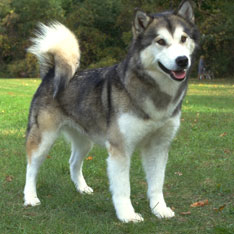

DOG
DOG: Methinks you are a DOG of breed Alaskan_malamute!
*************************************


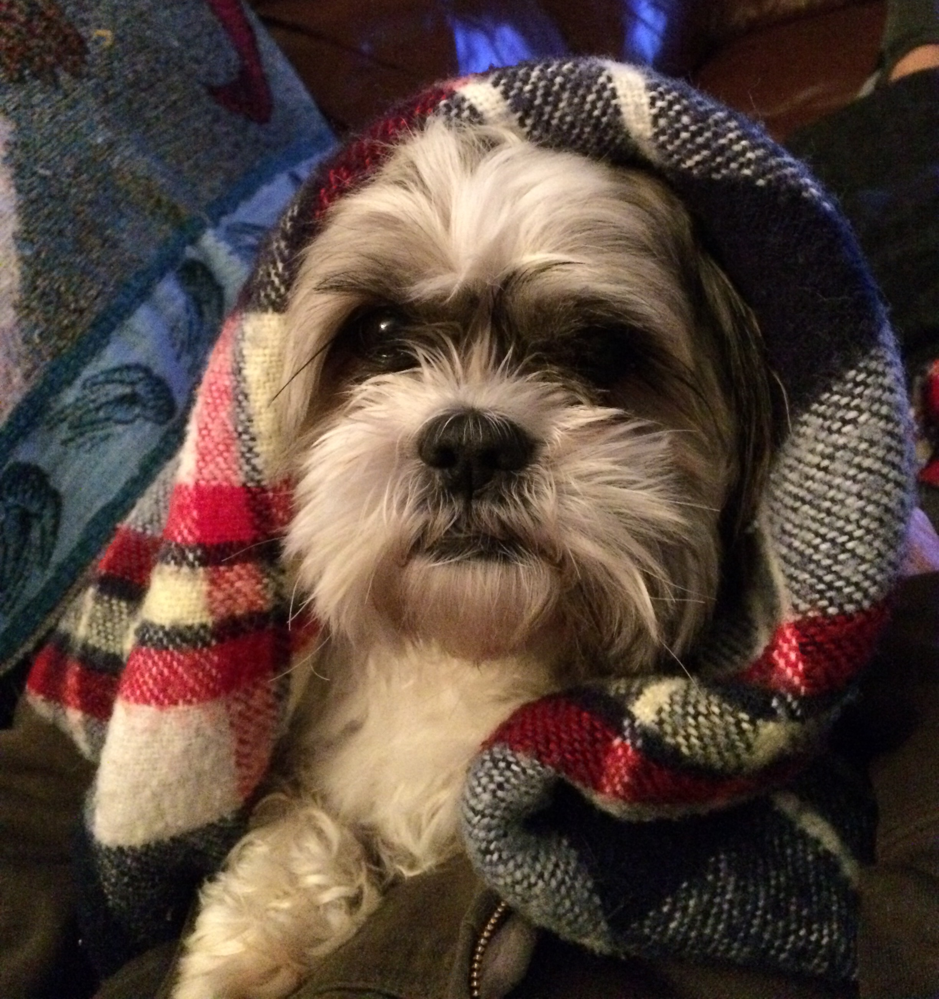

DOG
DOG: Methinks you are a DOG of breed Lowchen!
*************************************


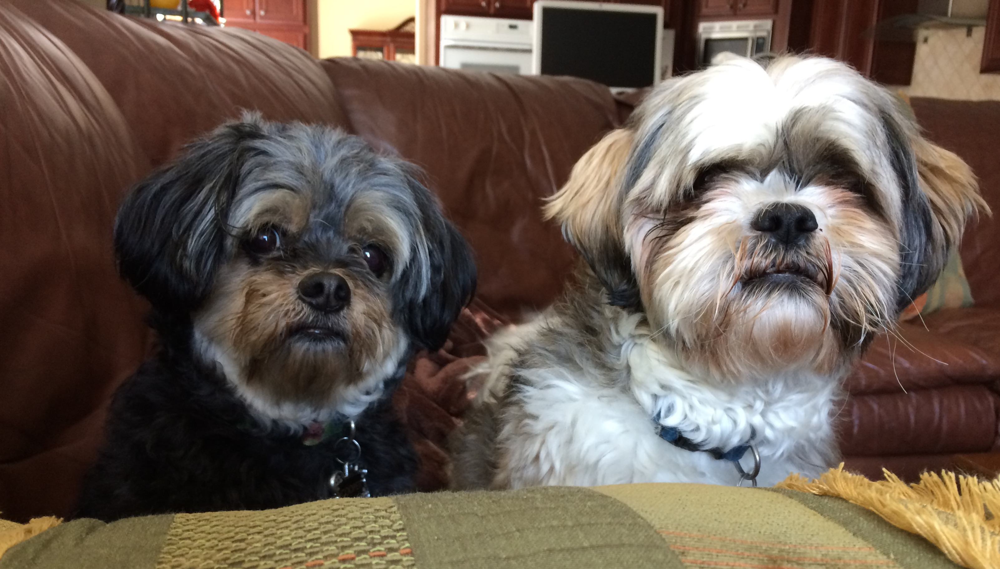

DOG
DOG: Methinks you are a DOG of breed Havanese!
*************************************


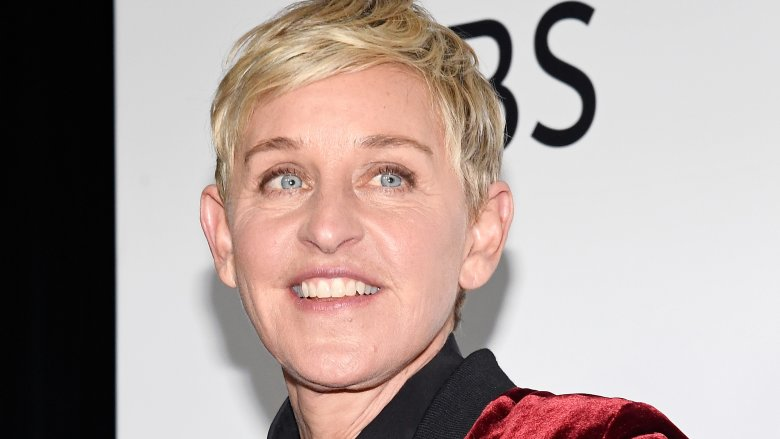

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a Silky_terrier!
*************************************


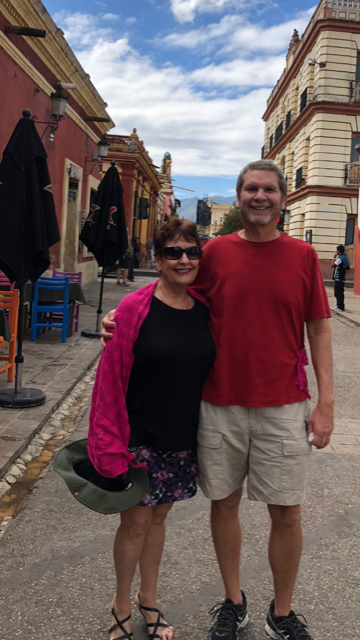

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a Great_dane!
*************************************


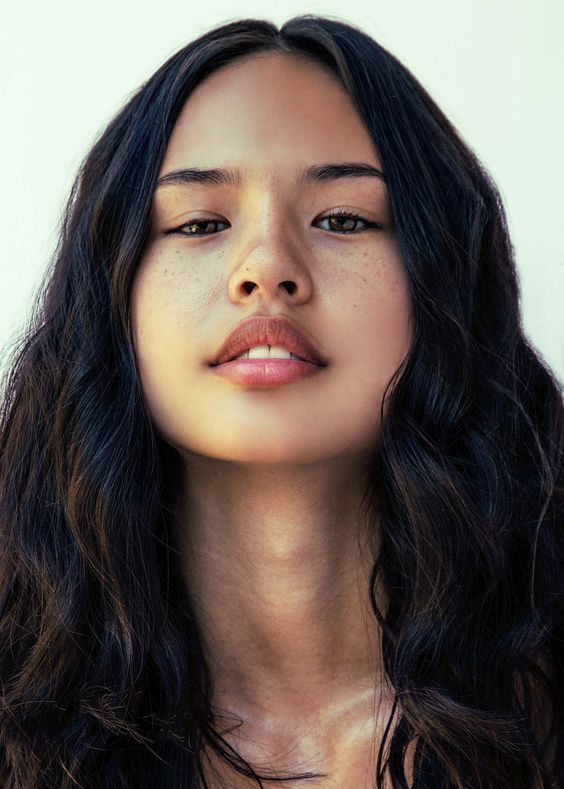

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a English_toy_spaniel!
*************************************


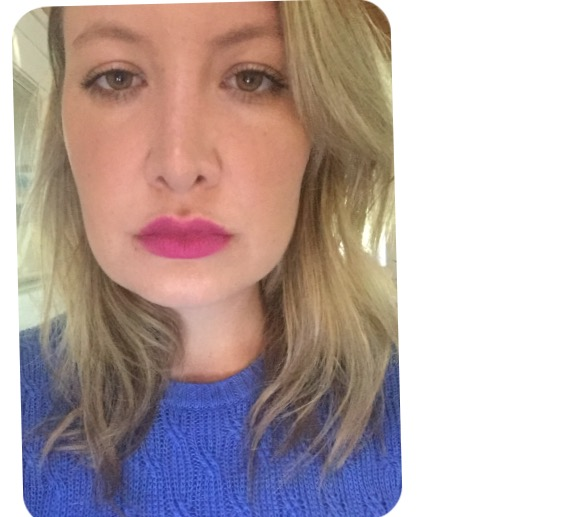

ALIEN
ALIEN: Methinks you are an ALIEN. Niether human nor dog! (ERROR)
*************************************


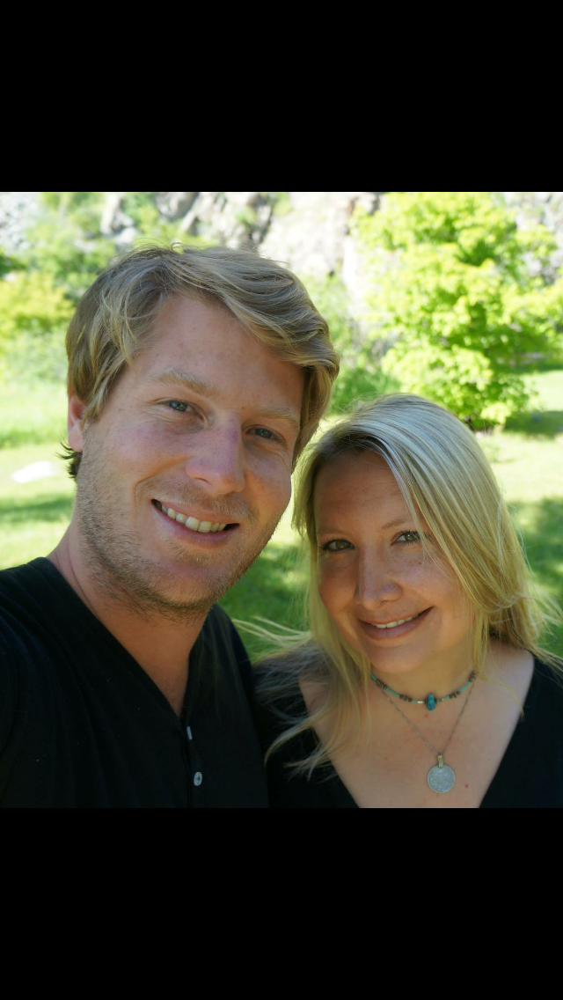

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a Afghan_hound!
*************************************


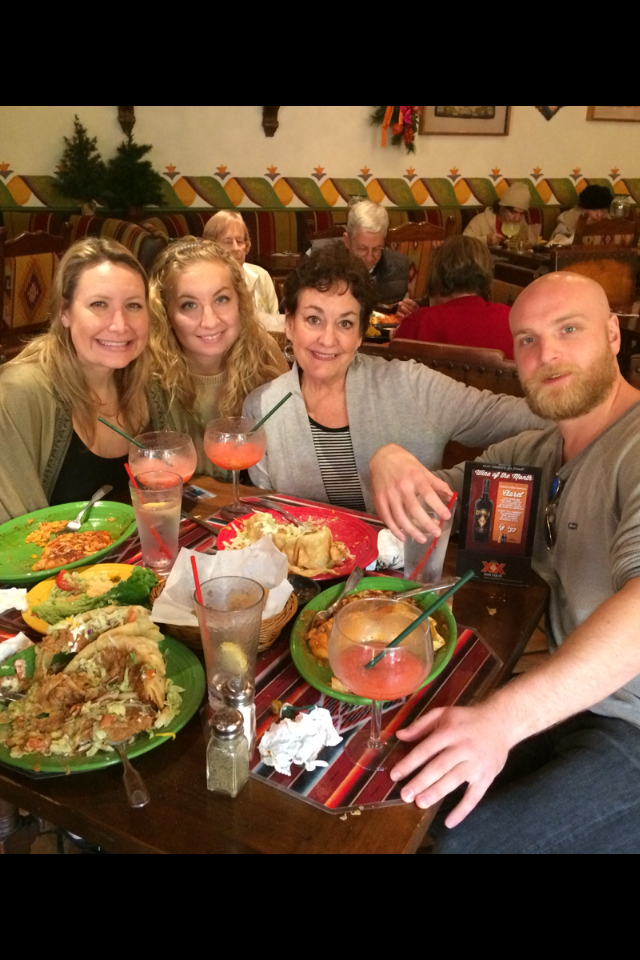

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a Chihuahua!
*************************************


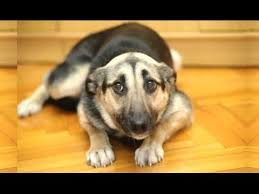

DOG
DOG: Methinks you are a DOG of breed Anatolian_shepherd_dog!
*************************************


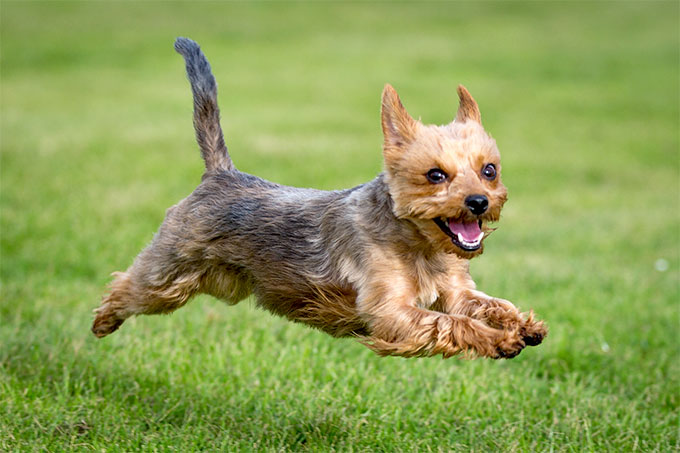

DOG
DOG: Methinks you are a DOG of breed Norfolk_terrier!
*************************************


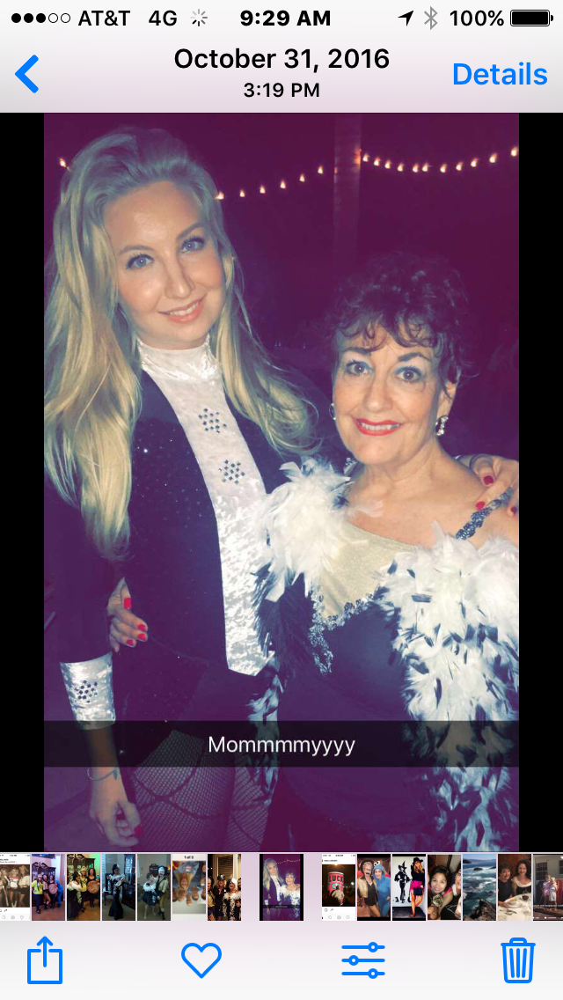

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a English_toy_spaniel!
*************************************


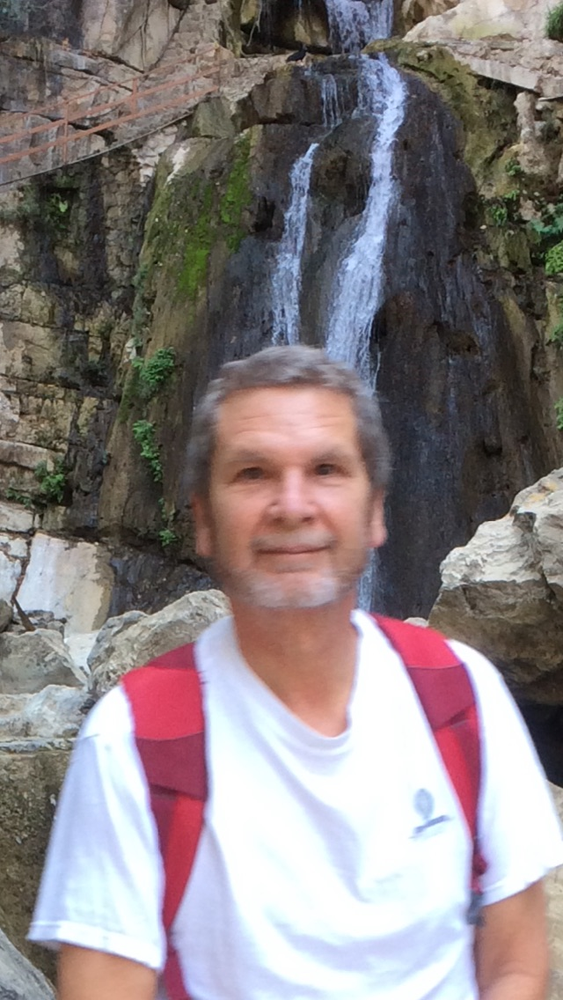

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a American_water_spaniel!
*************************************


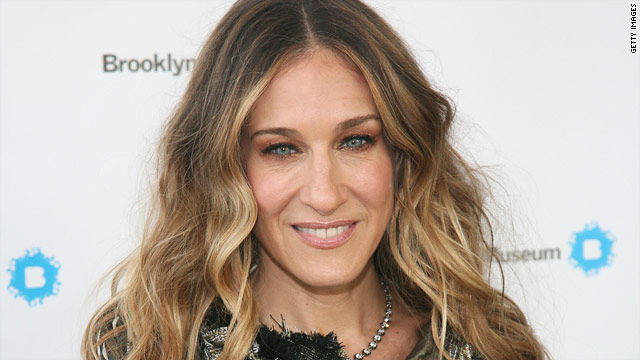

HUMAN
HUMAN: Methinks I see a HUMAN that looks like a English_toy_spaniel!
*************************************


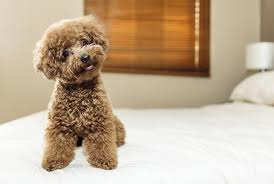

DOG
DOG: Methinks you are a DOG of breed Poodle!
*************************************


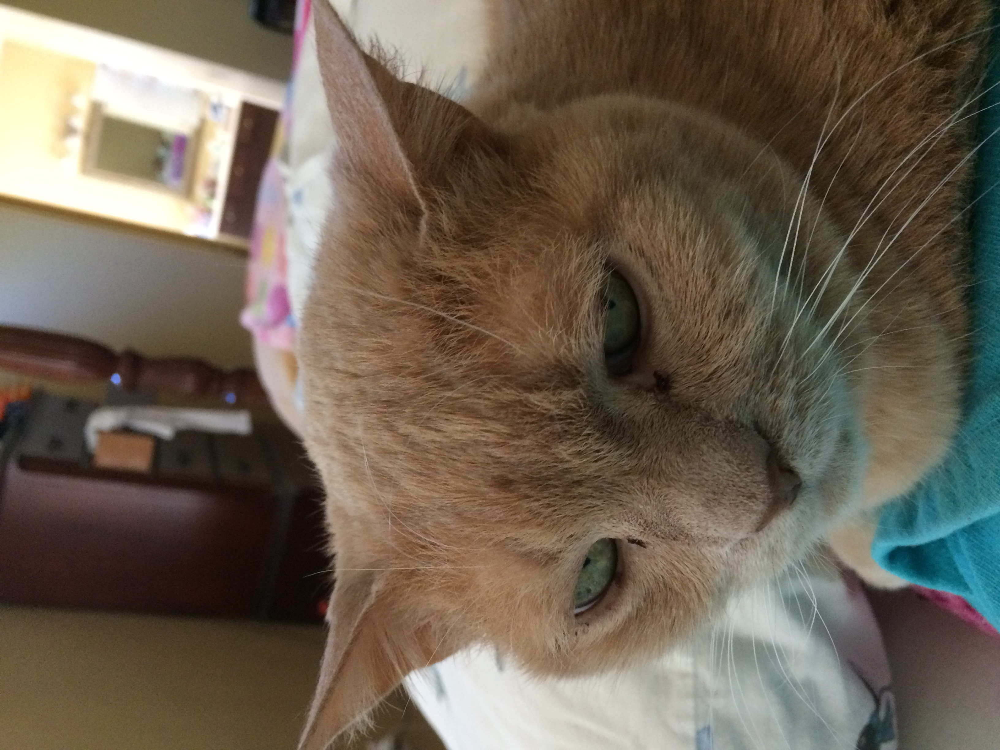

DOG
DOG: Methinks you are a DOG of breed Pomeranian!
*************************************


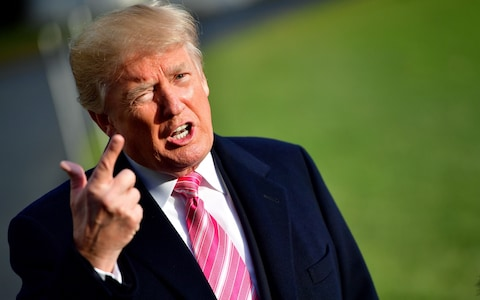

ALIEN
ALIEN: Methinks you are an ALIEN. Niether human nor dog! (ERROR)


In [55]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

from IPython.display import Image, display

myImageFiles = glob(filesRoot + 'myImages/*.*')

if myImageFiles == 0:
    print("ERROR: Empty image list.")
    print("You must place images of dogs (and/or people into folder " + filesRoot + "myImages")
    
for i in range(len(myImageFiles)):
    print('*************************************')
    display(Image(myImageFiles[i],width=256))
    result = dogOrHuman(myImageFiles[i])
    outType = result[0][1]
    start = outType.rfind('.') + 1
    outType = outType[start:-1]

    if(result[0][0] < 0):
        print("DOG: Methinks you are a DOG of breed {}!".format(outType))
    elif result[0][0] > 0:
        for i in range(len(result)):
            print("HUMAN: Methinks I see a HUMAN that looks like a {}!".format(outType))
    else:
        print("ALIEN: Methinks you are an ALIEN. Niether human nor dog! (ERROR)")
        
